# Laboratorium 4.

## a) Proszę wczytać przykładowy obraz (pierwszy z laboratorium 3).

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

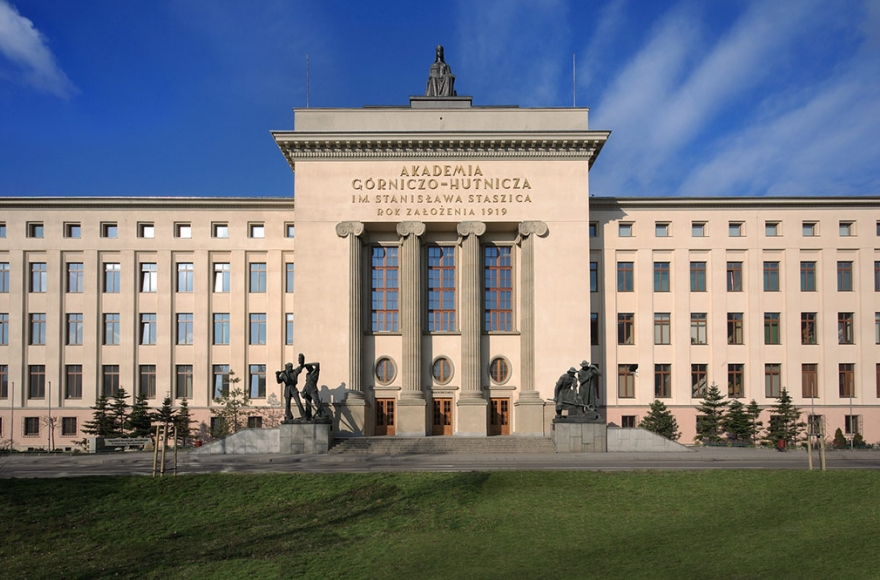

In [ ]:
image = cv2.imread("/content/drive/MyDrive/AiPO/lab3_1.jpg")
cv2_imshow(image)

## b) Proszę sprawdzić i porównać wynik następującej operacji: zmniejszania rozmiaru obrazu o 50 % - jedną z wybranych metod - a następnie zwiększenie o 50% z użyciem wszystkich dostępnych w OpenCV metod interpolacji. Proszę porównać uzyskany wynik z obrazem pierwotnym.

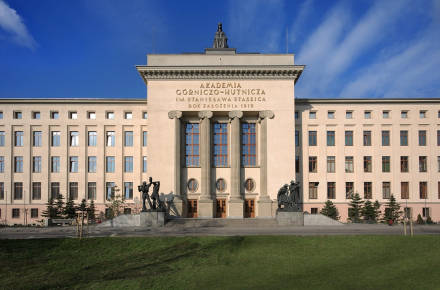

In [ ]:
half = cv2.resize(image, (0, 0), fx = 0.5, fy = 0.5)
cv2_imshow(half)

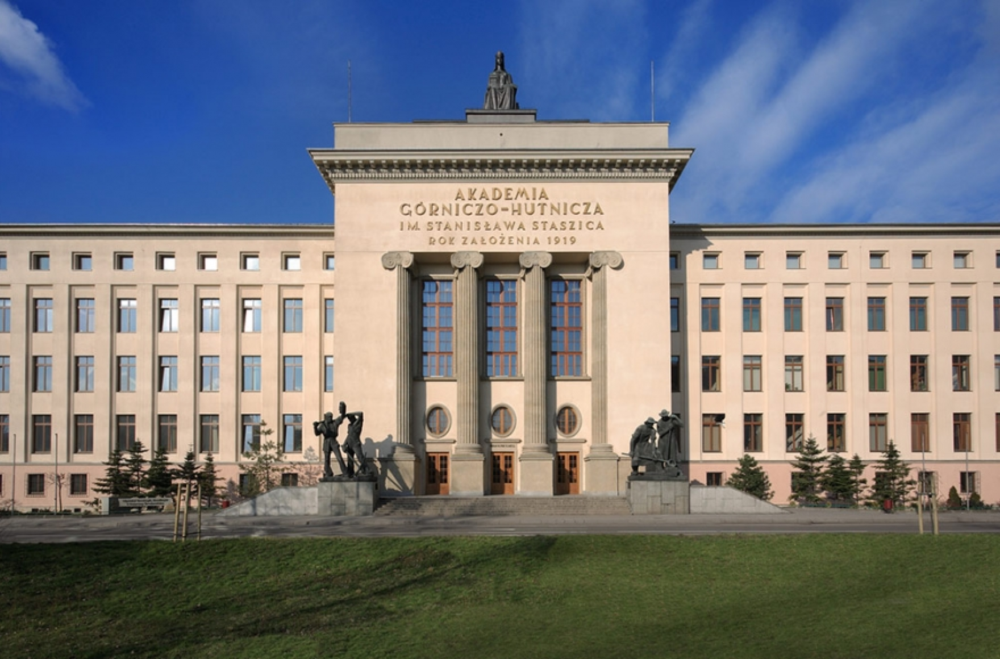

In [ ]:
IL = cv2.resize(image, (image.shape[1]*2, image.shape[0]*2),
                interpolation = cv2.INTER_LINEAR)
cv2_imshow(IL)

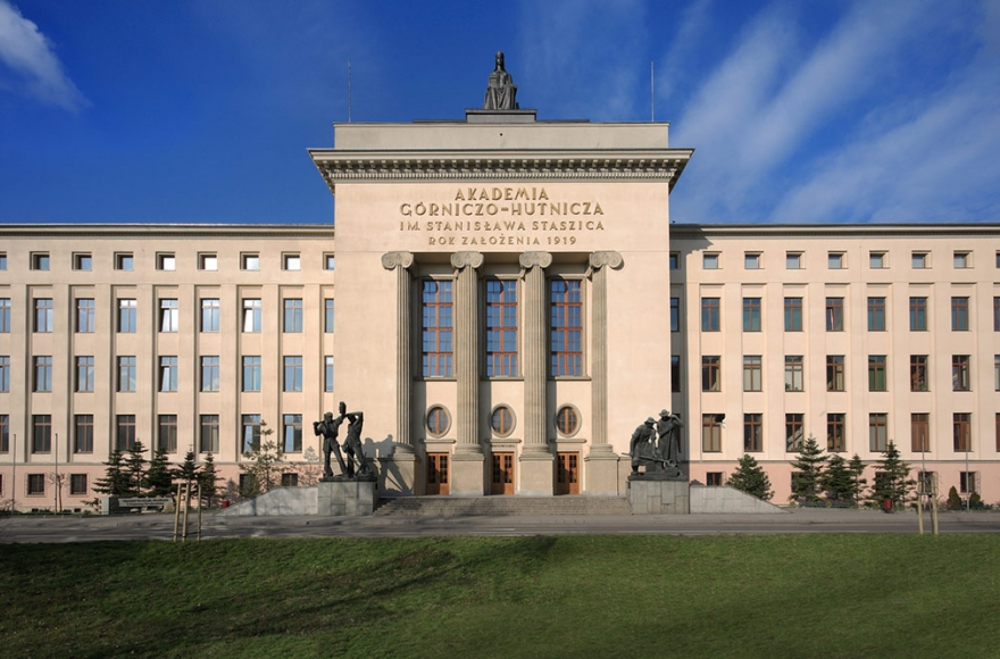

In [ ]:
IN = cv2.resize(image, (image.shape[1]*2, image.shape[0]*2),
                interpolation = cv2.INTER_NEAREST)
cv2_imshow(IN)

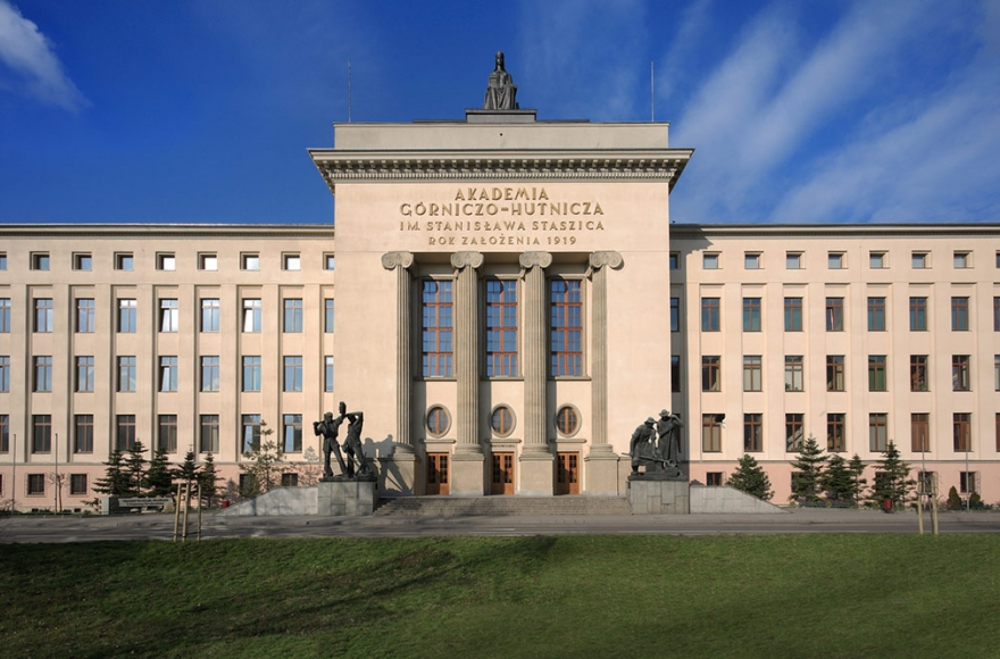

In [ ]:
IA = cv2.resize(image, (image.shape[1]*2, image.shape[0]*2),
                interpolation = cv2.INTER_AREA)
cv2_imshow(IA)

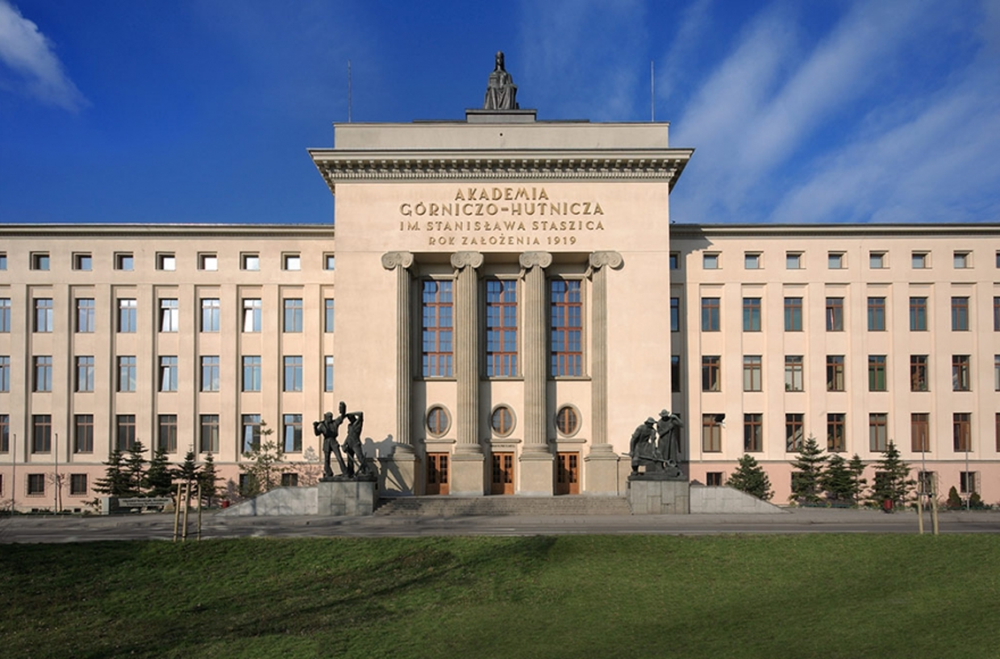

In [ ]:
IC = cv2.resize(image, (image.shape[1]*2, image.shape[0]*2),
                interpolation = cv2.INTER_CUBIC)
cv2_imshow(IC)

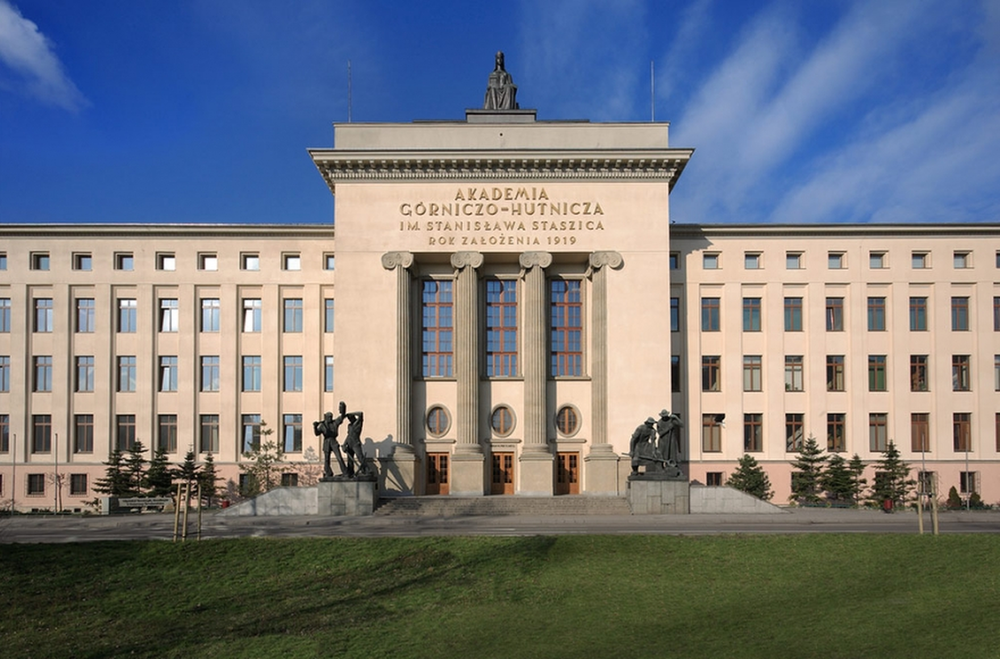

In [ ]:
IL4 = cv2.resize(image, (image.shape[1]*2, image.shape[0]*2),
                interpolation = cv2.INTER_LANCZOS4)
cv2_imshow(IL4)

Dla obrazów wynikowych metod NEAREST oraz AREA można zauważyć "ziarno", dodatkowo jakość powiększenia nie jest zadowalająca. Najlepszy wynik został uzyskany dla metody LINEAR, która dała obraz najbardziej zbliżony do oryginału (pomimo lekkiego rozmycia). Pozostałe metody (CUBIC I LANCZOS4) uzyskują podobne wyniki, które można porównać do metody LINEAR z lekkim szumem.

## c) Proszę nałożyć na obraz filtr uśredniający o macierzy K w rozmiarze 5x5, 10x10 i 15x15. Jaki efekt został zaobserwowany?

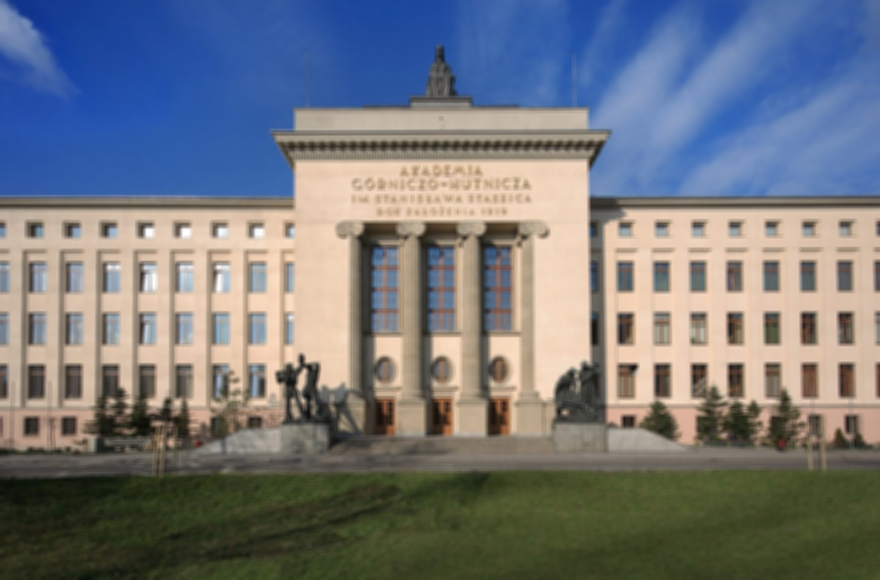

In [ ]:
b1 = cv2.blur(image,(5,5))
cv2_imshow(b1)

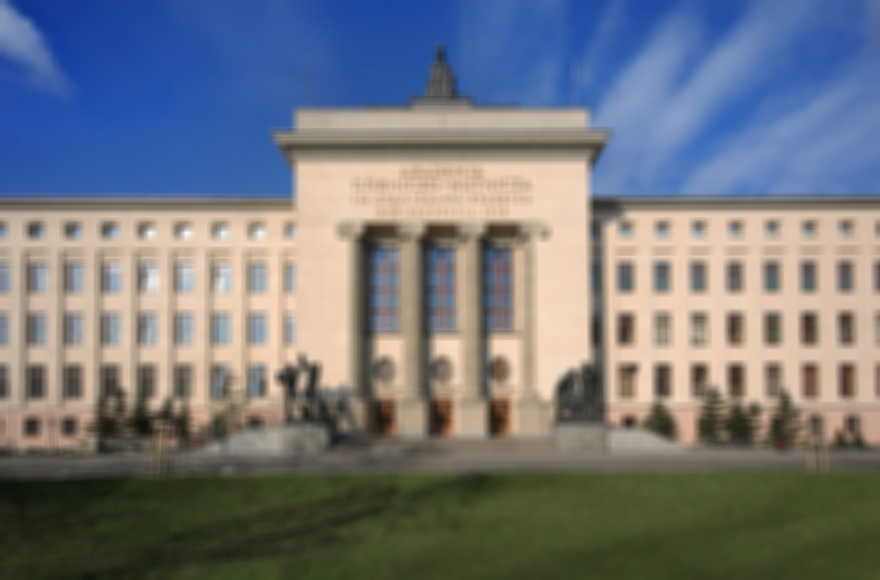

In [ ]:
b2 = cv2.blur(image,(10,10))
cv2_imshow(b2)

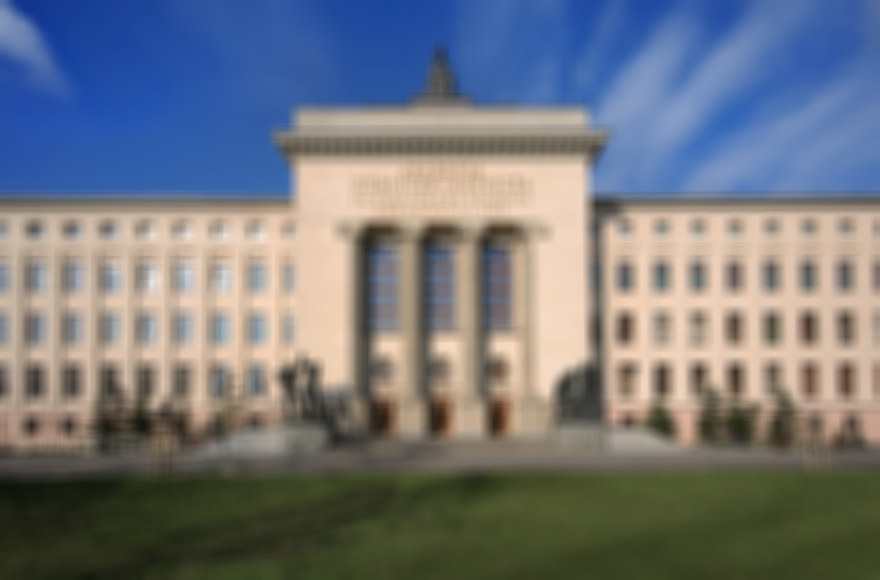

In [ ]:
b3 = cv2.blur(image,(15,15))
cv2_imshow(b3)

Dzięki filtrowi uśredniającemu został zaobserwowany efekt rozmycia zwiększający się wraz z rozmiarem macierzy.

## d) Proszę nałożyć na obraz filtr medianowy o rozmiarze 5x5, 11x11 i 15x15. Jaki efekt został zaobserwowany?

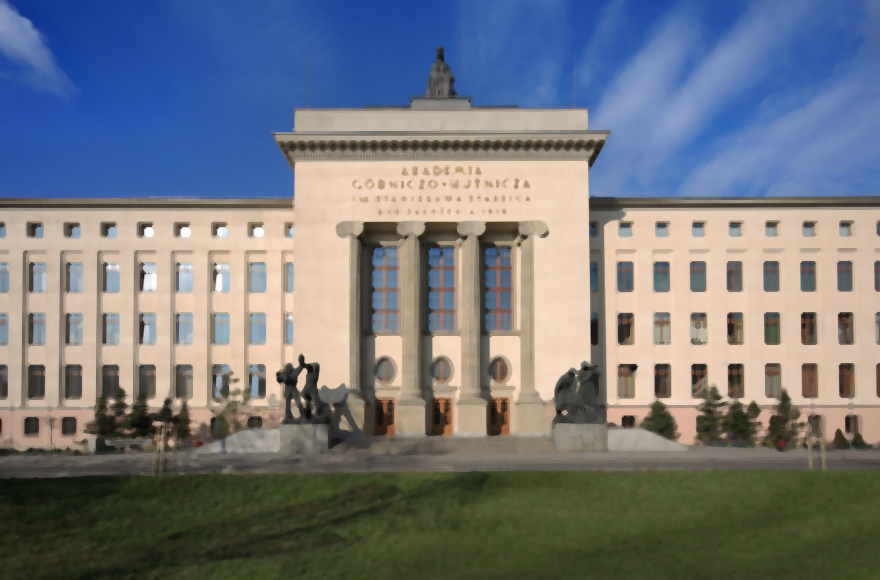

In [ ]:
mb1 = cv2.medianBlur(image,5)
cv2_imshow(mb1)

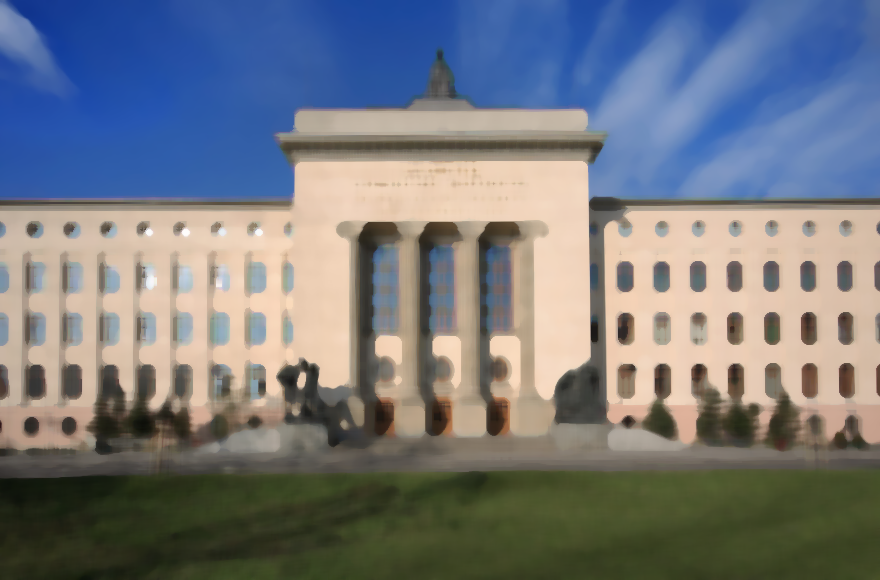

In [ ]:
mb2 = cv2.medianBlur(image,11)
cv2_imshow(mb2)

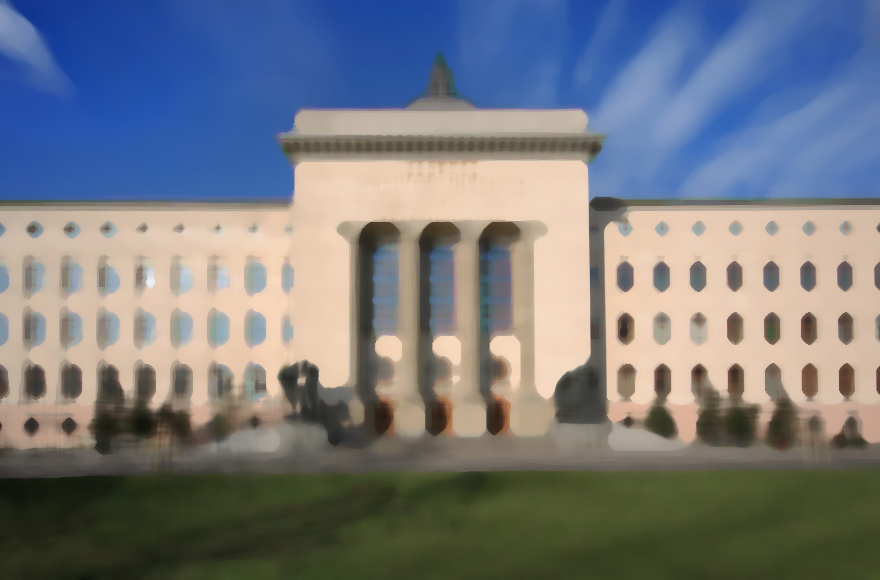

In [ ]:
mb3 = cv2.medianBlur(image,15)
cv2_imshow(mb3)

Użycie filtru medianowego pozwoliło na usunięcie zakłóceń oraz szumów. Zwiększenie rozmiarów macierzy spowodowało utratę coraz większej ilości szczegółów.

## e) Proszę nałożyć na obraz filtr gaussowski (o rozmiarze 5) i zaobserwować uzyskane wyniki.

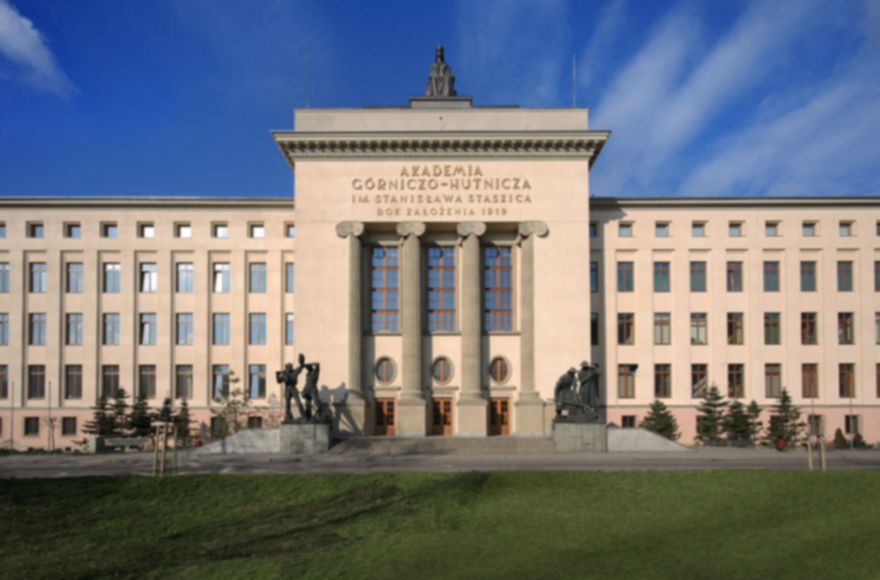

In [ ]:
gb = cv2.GaussianBlur(image,(5,5),0)
cv2_imshow(gb)

Filtr Gaussowski wprowadza wygładzenie obrazu, szczególnie na krawędziach
obiektów. Napisy są lepiej widoczne niż w przypadku rozmycia.

## f) Proszę zbinaryzować obraz po przefiltrowaniu go powyższymi metodami i porównać do binaryzacji bez filtracji.

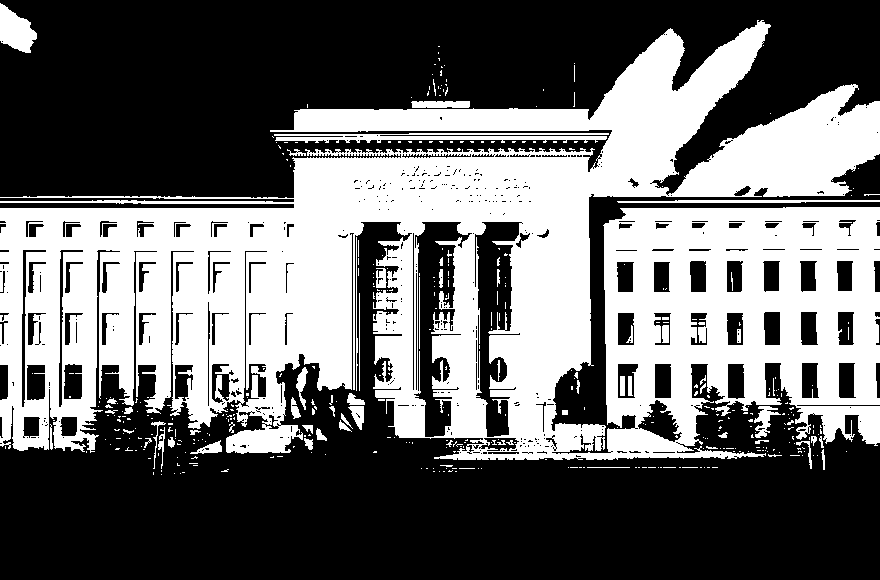

In [ ]:
#binaryzacja bez filtracji
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
ret, thresh1 = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY)
cv2_imshow(thresh1)


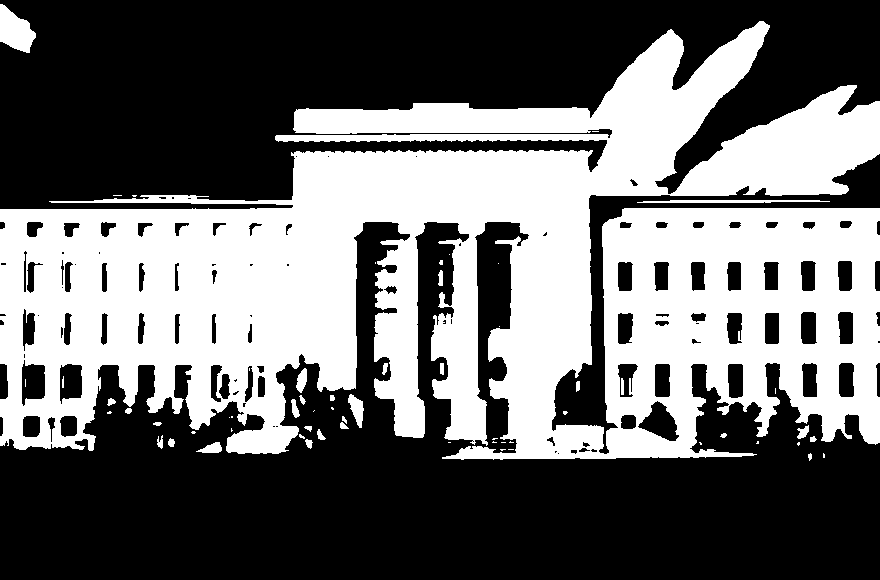

In [ ]:
#filtr uśredniający + binaryzacja
b1 = cv2.blur(gray,(5,5))
ret, thresh1 = cv2.threshold(b1, 120, 255, cv2.THRESH_BINARY)
cv2_imshow(thresh1)

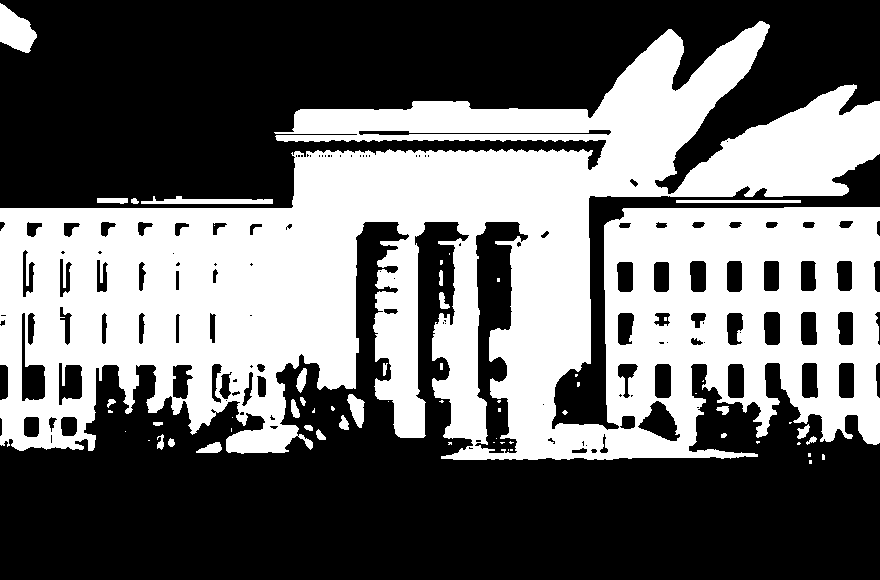

In [ ]:
#filtr medianowy + binaryzacja
mb1 = cv2.medianBlur(gray,5)
ret, thresh1 = cv2.threshold(mb1, 120, 255, cv2.THRESH_BINARY)
cv2_imshow(thresh1)

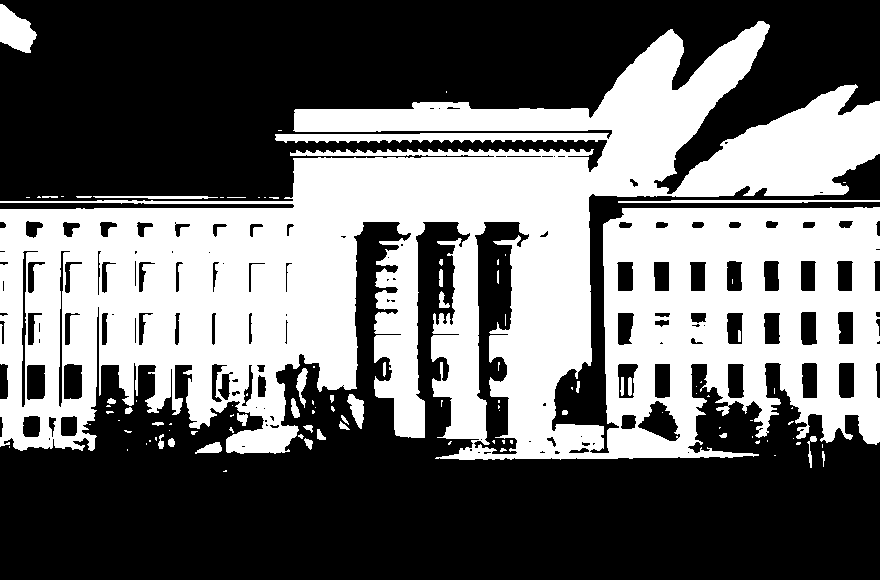

In [ ]:
#filtr gaussowski + binaryzacja
gb = cv2.GaussianBlur(gray,(5,5),0)
ret, thresh1 = cv2.threshold(gb, 120, 255, cv2.THRESH_BINARY)
cv2_imshow(thresh1)

Binaryzacja bez filtracji zachowuje na obrazach więcej szczegółów. Z użytych metod filtracji, najlepsze efekty daje filtr Gaussa, który np. zachował większość krawędzi okien.

## g) Proszę nałożyć na obraz filtry Roberts cross, Prewitta i Sobela

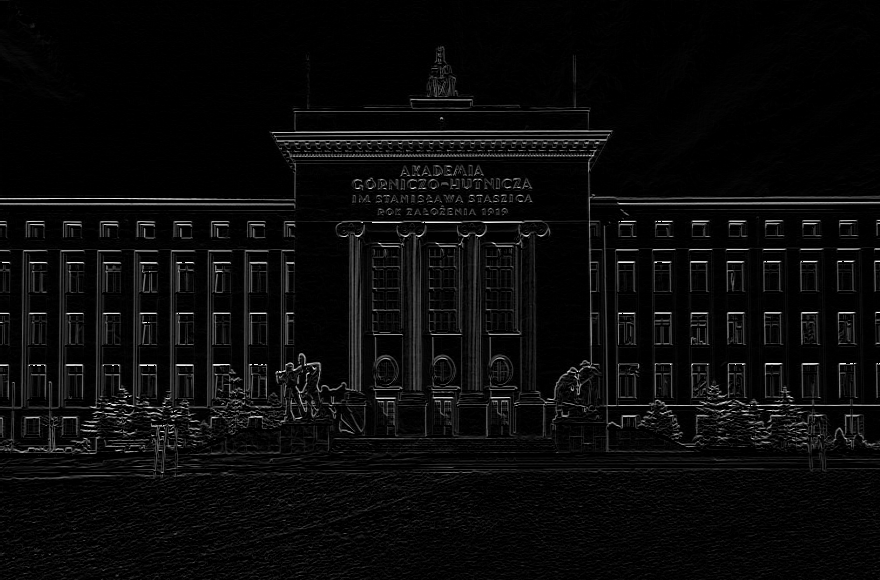

In [ ]:
import numpy as np
roberts_cross_v = np.array( [[1, 0 ],
                             [0,-1 ]] )
  
roberts_cross_h = np.array( [[ 0, 1 ],
                             [ -1, 0 ]] )
roberts_image = cv2.filter2D(gray, -1, roberts_cross_v) + cv2.filter2D(gray, -1, roberts_cross_h)
cv2_imshow(roberts_image)



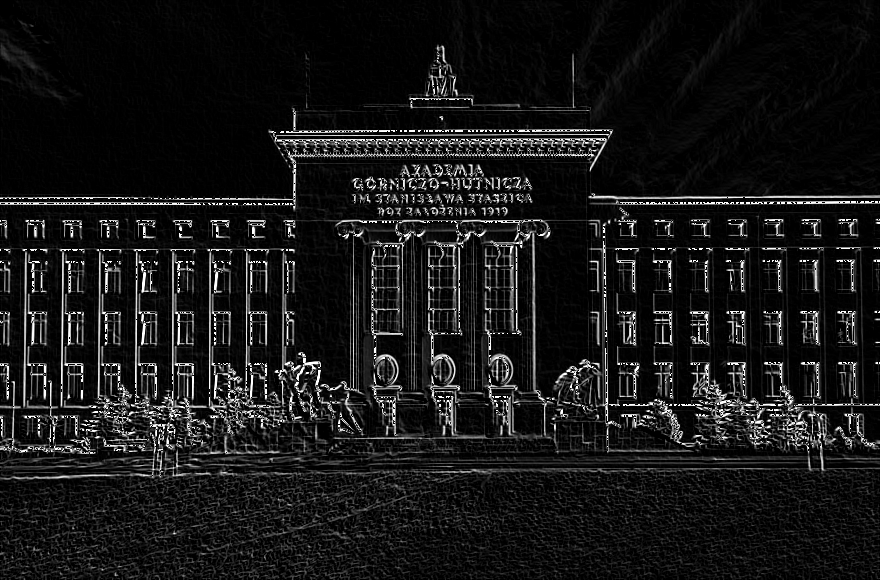

In [ ]:
prewitt_x = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]], dtype=np.float32)
prewitt_y = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]], dtype=np.float32)
prewitt_image = cv2.filter2D(gray, -1, prewitt_x) + cv2.filter2D(gray, -1, prewitt_y)
cv2_imshow(prewitt_image)

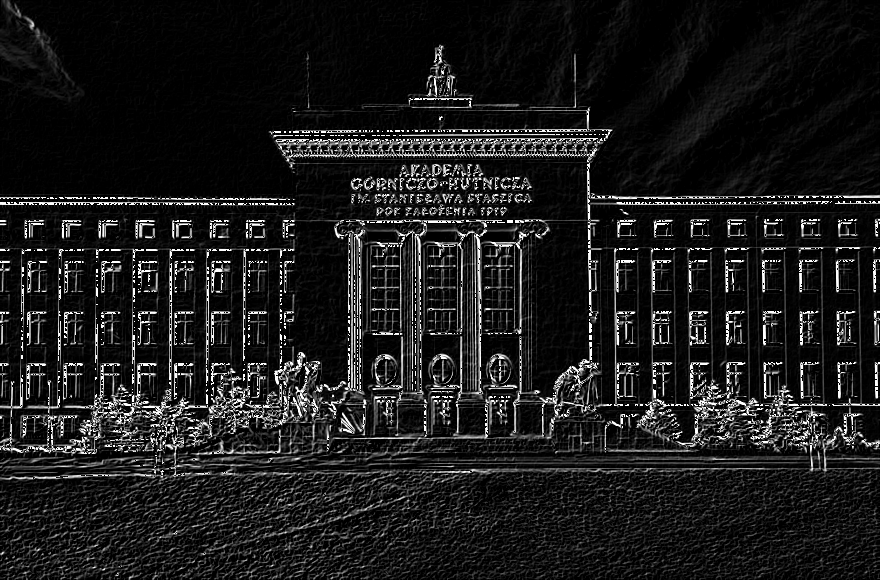

In [ ]:
import numpy as np
sobel_v = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])
  
sobel_h = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]])
sobel_image = cv2.filter2D(gray, -1, sobel_v) + cv2.filter2D(gray, -1, sobel_h)
cv2_imshow(sobel_image)


Filtry Sobela i Prewitta dały lepsze wyniki w wyodrębnianiu krawędzi ze względu na to, że krzyż Robertsa służy do wykrywania ukośnych krawędzi, przez co zaznaczone przez niego krawędzie są cienkie.